In [1]:
import sys
sys.path.append(r'../')
import os
os.chdir('../')
import sys
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.decomposition import PCA
import cebra.datasets
from functions import Database, preprocess_data, prep_data, plotting_neuronal_behavioural, plot_latent_timeseries
from plotting_functions import plot_phase_space, plot_ps_
from bundlenet import BunDLeNet, train_model
import seaborn as sns

%reload_ext autoreload
%autoreload 2

2024-02-09 18:06:56.681413: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-09 18:06:56.681433: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-09 18:06:56.682299: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-09 18:06:56.687284: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-09 18:06:57.427137: W tensorflow/compiler/tf2

In [2]:
os.getcwd()

'/home/akshey/Desktop/PhD/Code_repositories/BunDLe-Net-rat'

## Load Data

In [3]:
### Load Data and plot
rat_names = ['achilles', 'gatsby','cicero', 'buddy']
rat_name = rat_names[1] 
hippocampus_pos = cebra.datasets.init('rat-hippocampus-single-' + rat_name)

X = hippocampus_pos.neural.numpy()
B = hippocampus_pos.continuous_index.numpy()

## BunDLe-Net

In [4]:
X_, B_ = prep_data(X, B, win=20)

### Deploy BunDLe Net
model = BunDLeNet(latent_dim=3, num_behaviour=B_.shape[1])
model.build(input_shape=X_.shape)
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)

#X_train, X_test, B_train, B_test = timeseries_train_test_split(X_, B_)
loss_array = train_model(X_,
			 B_, 
			 model,
			 optimizer, 
			 gamma=0.9, 
			 n_epochs=500,
			 pca_init=True
						 )

Losses 0.003476 0.000276 0.003752: 100%|██████| 500/500 [02:51<00:00,  2.91it/s]


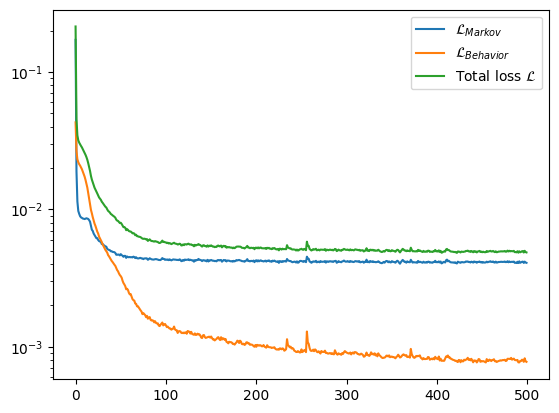

In [5]:
# Training losses vs epochs
plt.figure()
for i, label in  enumerate(["$\mathcal{L}_{{Markov}}$", "$\mathcal{L}_{{Behavior}}$","Total loss $\mathcal{L}$" ]):
	plt.semilogy(loss_array[:,i], label=label)
plt.legend()
plt.show()

## Projecting into latent space

In [6]:
Y0_BunDLeNet = model.tau(X_[:,0]).numpy() 

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_BunDLeNet_rat_' + str(rat_name), Y0_BunDLeNet)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_BunDLeNet_rat_' + str(rat_name), B_)

## Visualising embedding

<IPython.core.display.Javascript object>


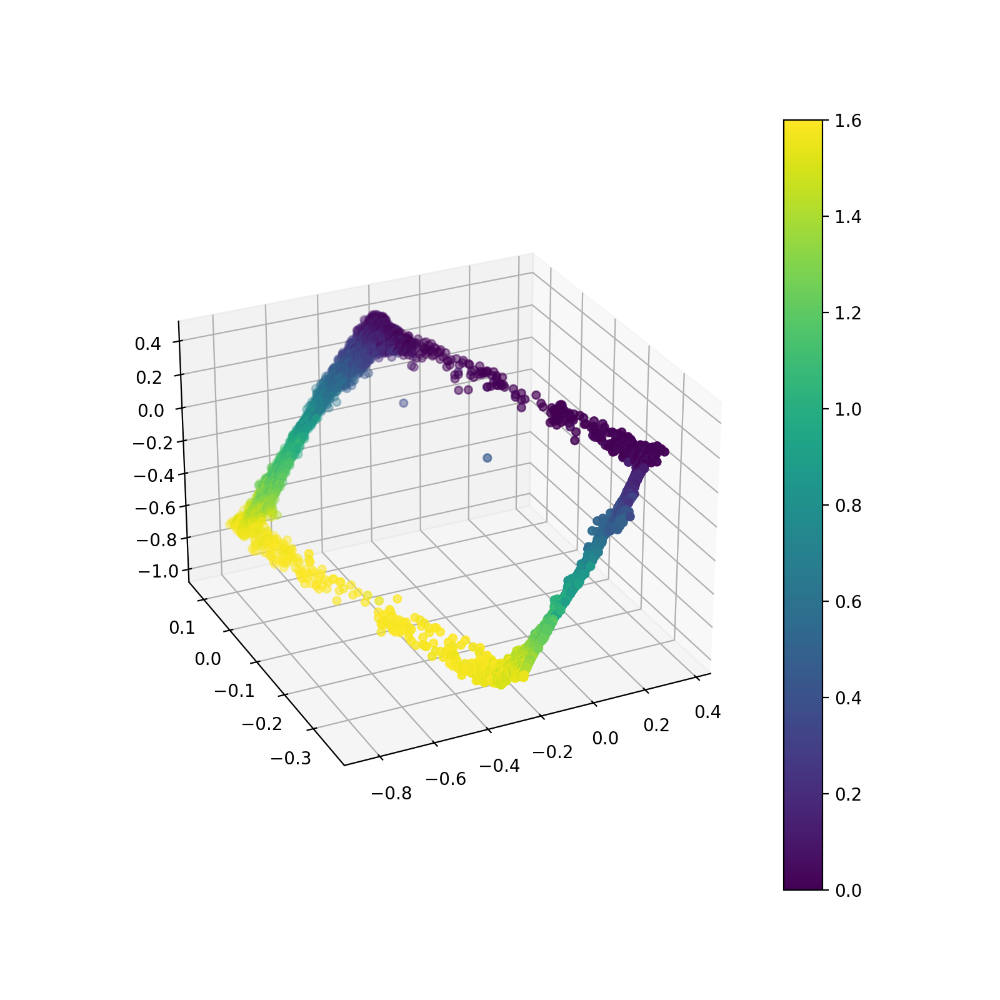

<IPython.core.display.Javascript object>


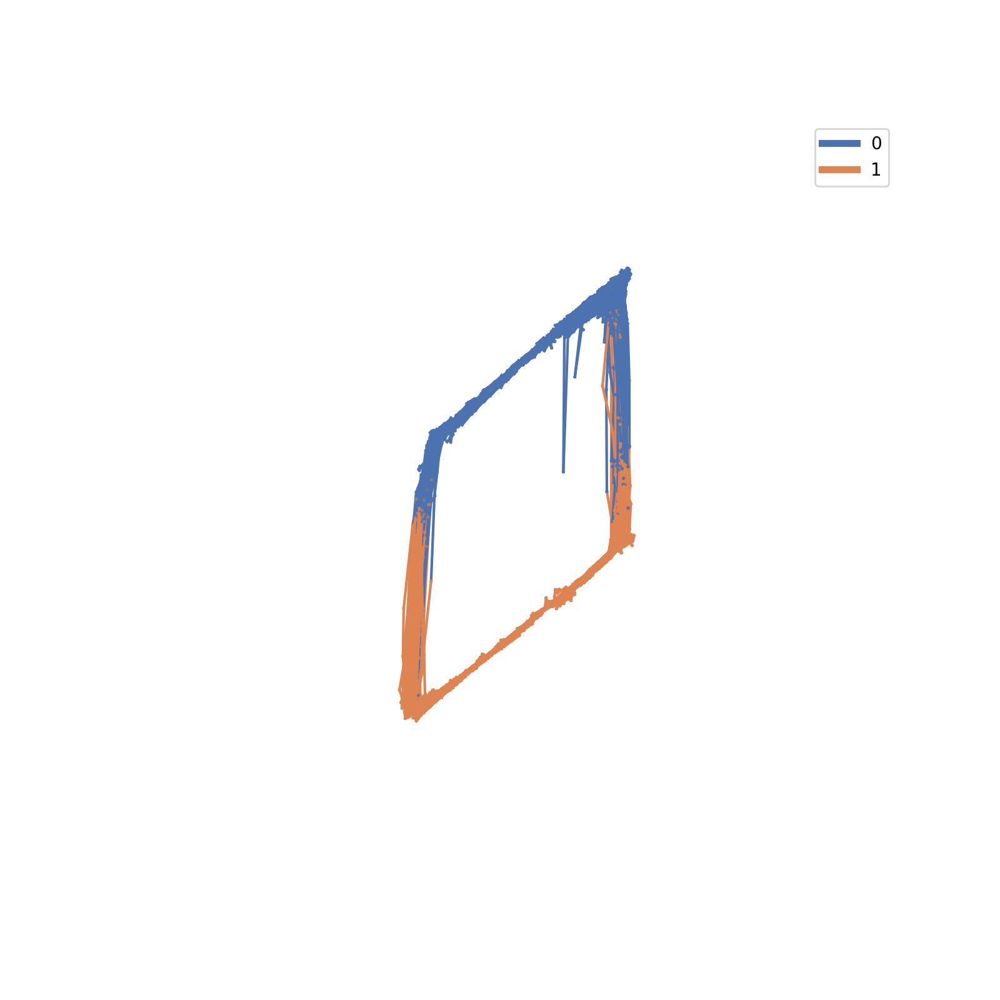

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [7]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_BunDLeNet[:, 0], Y0_BunDLeNet[:, 1], Y0_BunDLeNet[:, 2], c=B_[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_BunDLeNet, B_[:,1].astype(int), state_names = ['0', '1'])

# Comparision with other embedding algorithms

## PCA

In [8]:
dim = 3
pca = PCA(n_components=dim)
pca.fit(X_[:,0,0,:]) ###################### use X instead of X_
print('Percentage of variance explained by the first ', dim, ' PCs: ', pca.explained_variance_ratio_[:dim].sum().round(3))

### Projecting into latent space
Y0_pca = pca.transform(X_[:,0,0,:])

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_pca_rat_' + str(rat_name), Y0_pca)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_pca_rat_' + str(rat_name), B_)

Percentage of variance explained by the first  3  PCs:  0.336


<IPython.core.display.Javascript object>


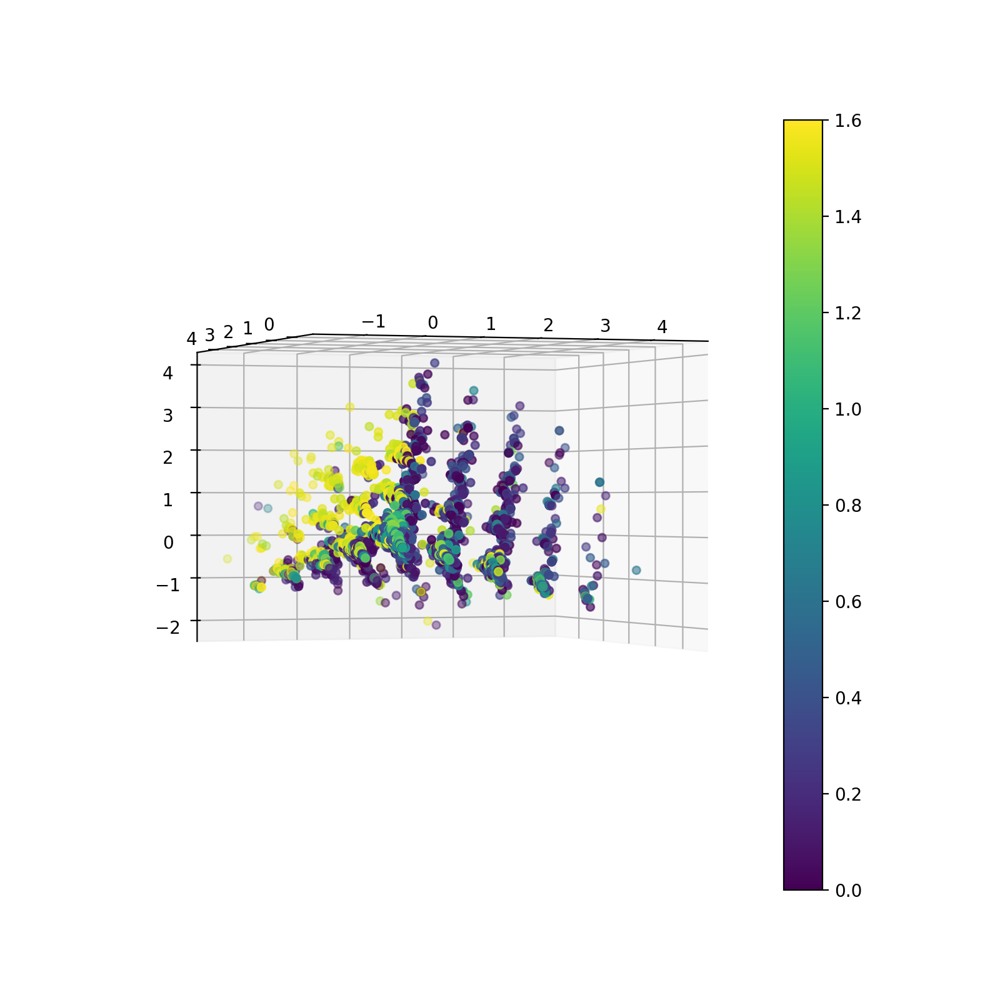

<IPython.core.display.Javascript object>


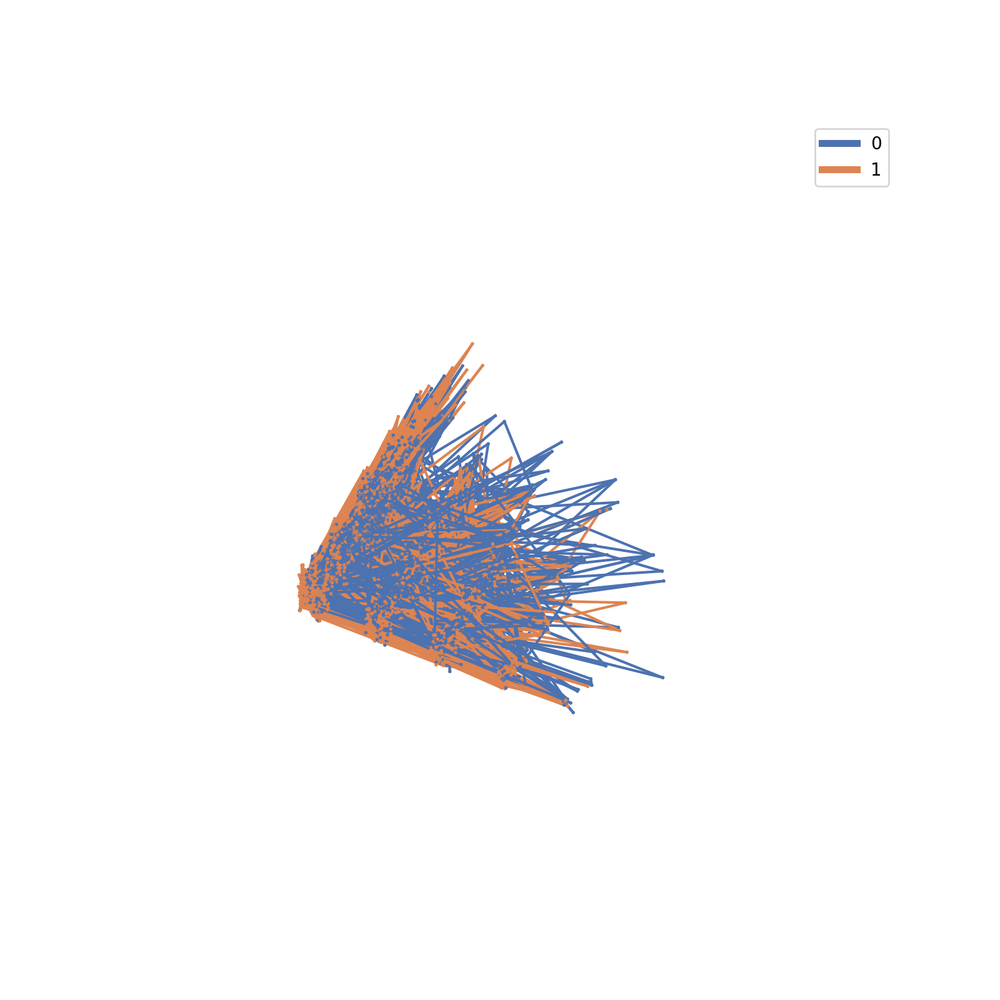

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [9]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_pca[:, 0], Y0_pca[:, 1], Y0_pca[:, 2], c=B_[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_pca, B_[:,1].astype(int), state_names = ['0', '1'])

# t-SNE


In [10]:
from sklearn.manifold import TSNE

### Deploy tsne
dim = 3
tsne = TSNE(n_components=dim, init='pca', perplexity=80)

### Projecting into latent space
Y0_tsne = tsne.fit_transform(X_[:,0,0,:])

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_tsne_rat_' + str(rat_name), Y0_tsne)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_tsne_rat_' + str(rat_name), B_)

<IPython.core.display.Javascript object>


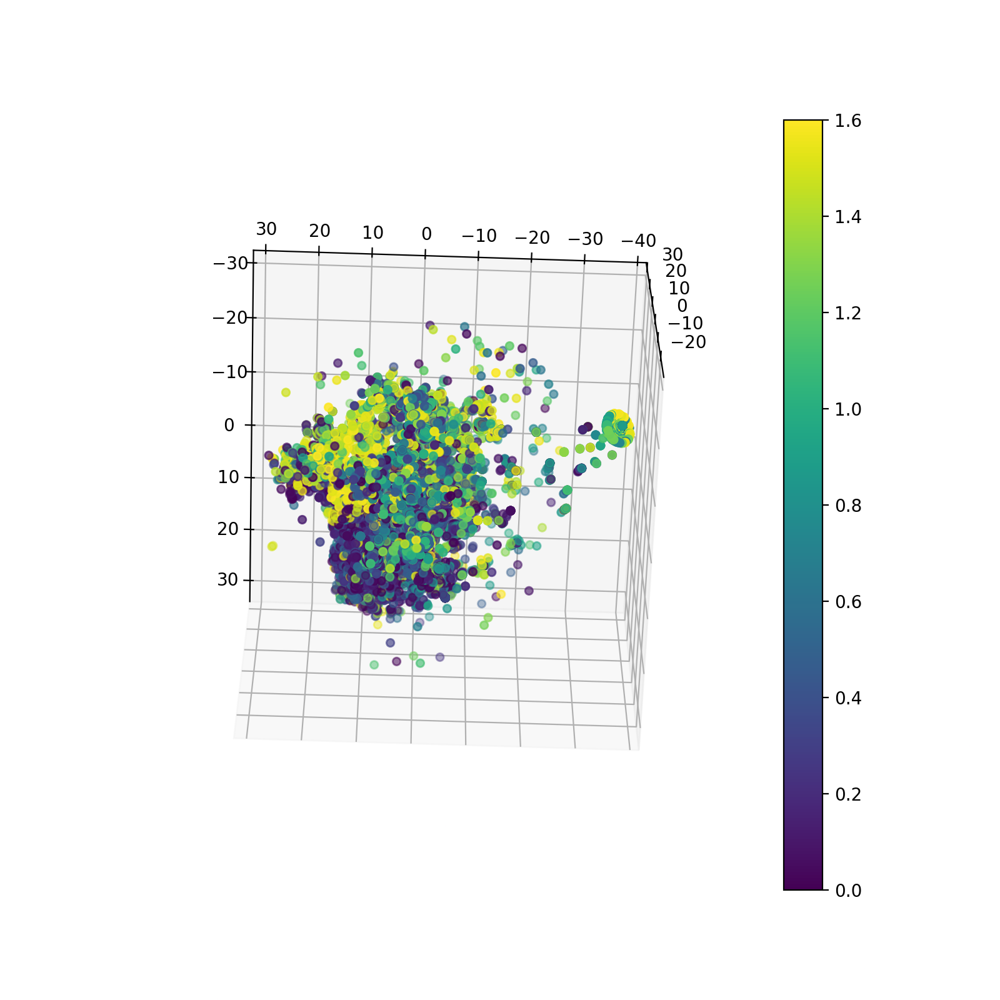

<IPython.core.display.Javascript object>


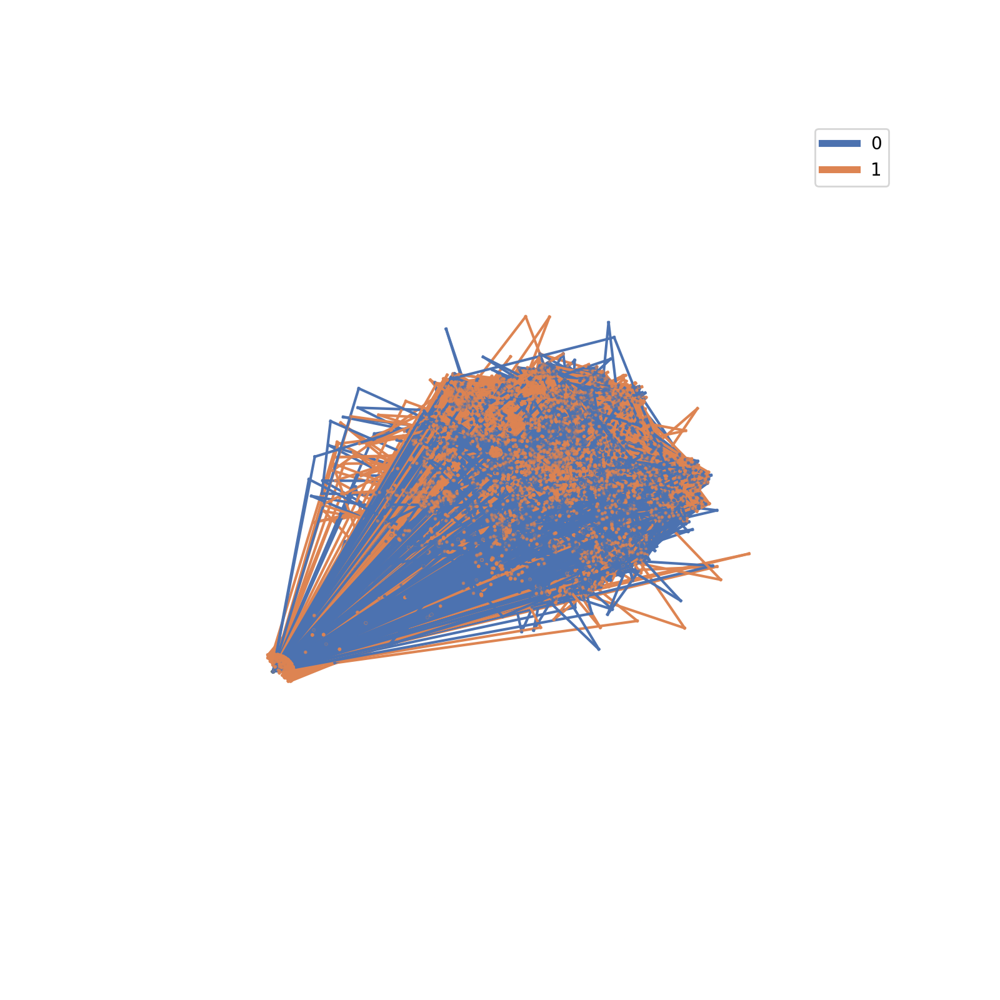

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [11]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_tsne[:, 0], Y0_tsne[:, 1], Y0_tsne[:, 2], c=B_[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_tsne, B_[:,1].astype(int), state_names = ['0', '1'])

## CEBRA-Hybrid

In [12]:
from cebra import CEBRA
cebra_hybrid_model = CEBRA(model_architecture='offset10-model',
                        batch_size=512,
                        learning_rate=3e-4,
                        temperature=1,
                        output_dimension=3,
                        max_iterations=5000,
                        distance='cosine',
                        conditional='time_delta',
                        device='cuda_if_available',
                        verbose=True,
                        time_offsets=10,
                        hybrid = True)

In [13]:
cebra_hybrid_model.fit(X, B)
Y0_cebra = cebra_hybrid_model.transform(X)

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_cebra_rat_' + str(rat_name), Y0_cebra)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_cebra_rat_' + str(rat_name), B)

behavior_pos: -0.8083 behavior_neg:  6.4743 behavior_total:  5.6660 time_pos: -0


<IPython.core.display.Javascript object>


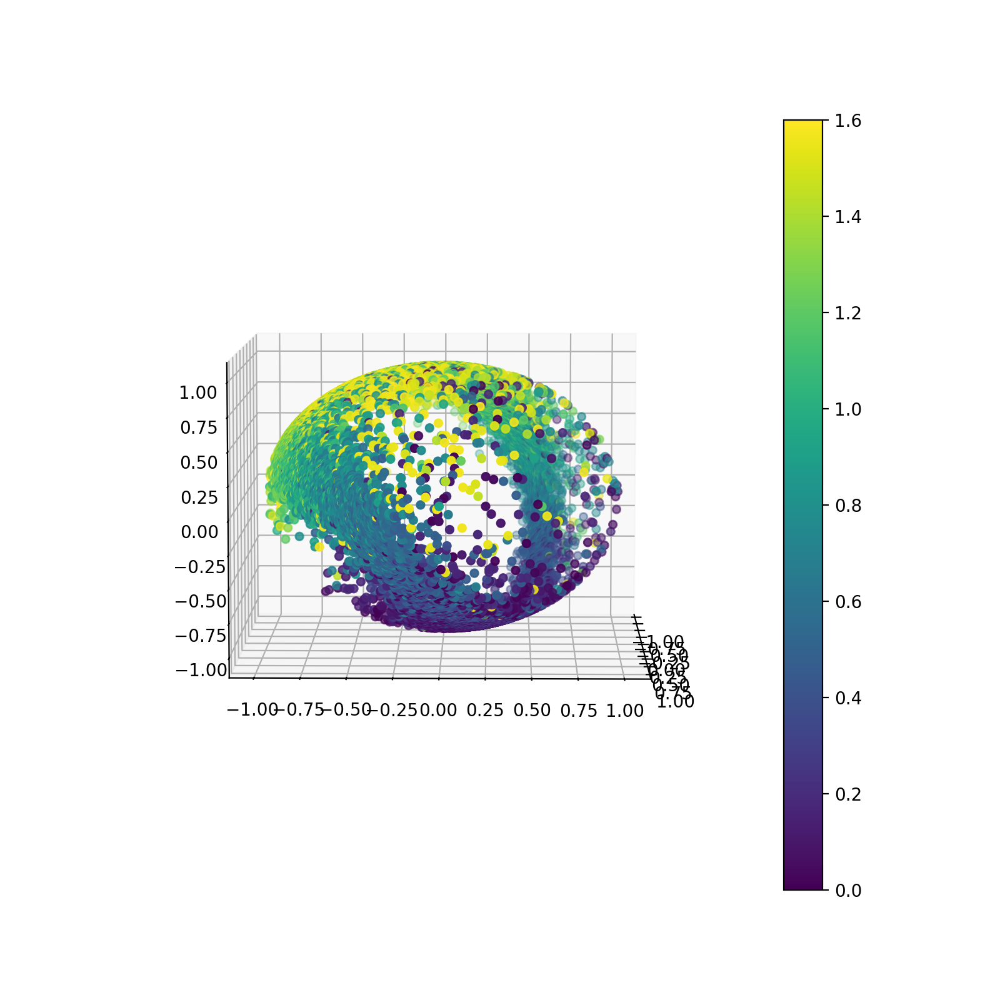

<IPython.core.display.Javascript object>


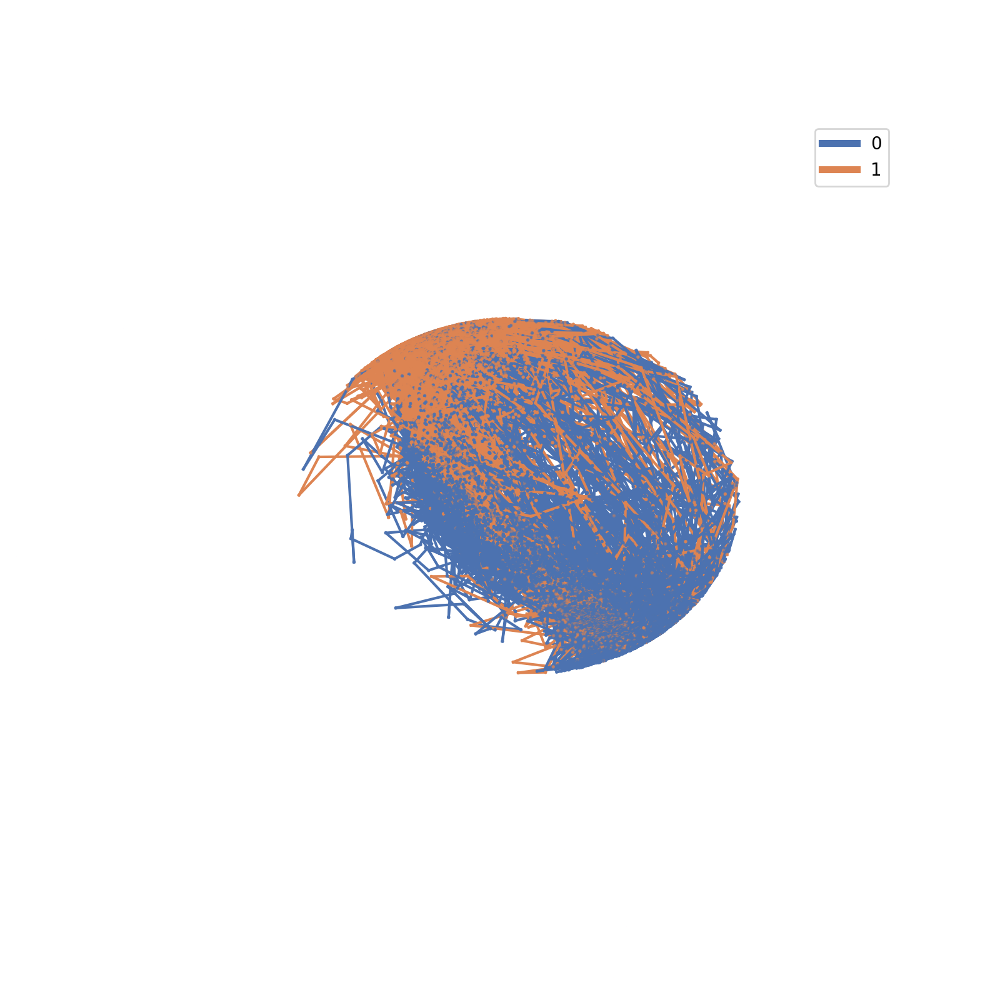

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [14]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_cebra[:, 0], Y0_cebra[:, 1], Y0_cebra[:, 2], c=B[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_cebra, B[:,1].astype(int), state_names = ['0', '1'])

## Autoencoder

In [15]:
from autoencoder import Autoencoder

### Prepare data
X_, B_ = prep_data(X, B, win=1)
X0_ = X_[:,0,:,:]

### Deploy Autoencoder
autoencoder = Autoencoder(latent_dim = 3, ninput_shape=X0_.shape)
opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)
autoencoder.compile(optimizer=opt, loss='mse', metrics=['mse'])

history = autoencoder.fit(
                        X0_,
                        X0_,
                        epochs=150,
                        batch_size=100,
                        verbose=False
                        )

X0_pred = autoencoder(X0_).numpy()

### Projecting into latent space
Y0_autoenc = autoencoder.encoder(X0_).numpy()

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_autoenc_rat_' + str(rat_name), Y0_autoenc)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_autoenc_rat_' + str(rat_name), B_)

<IPython.core.display.Javascript object>


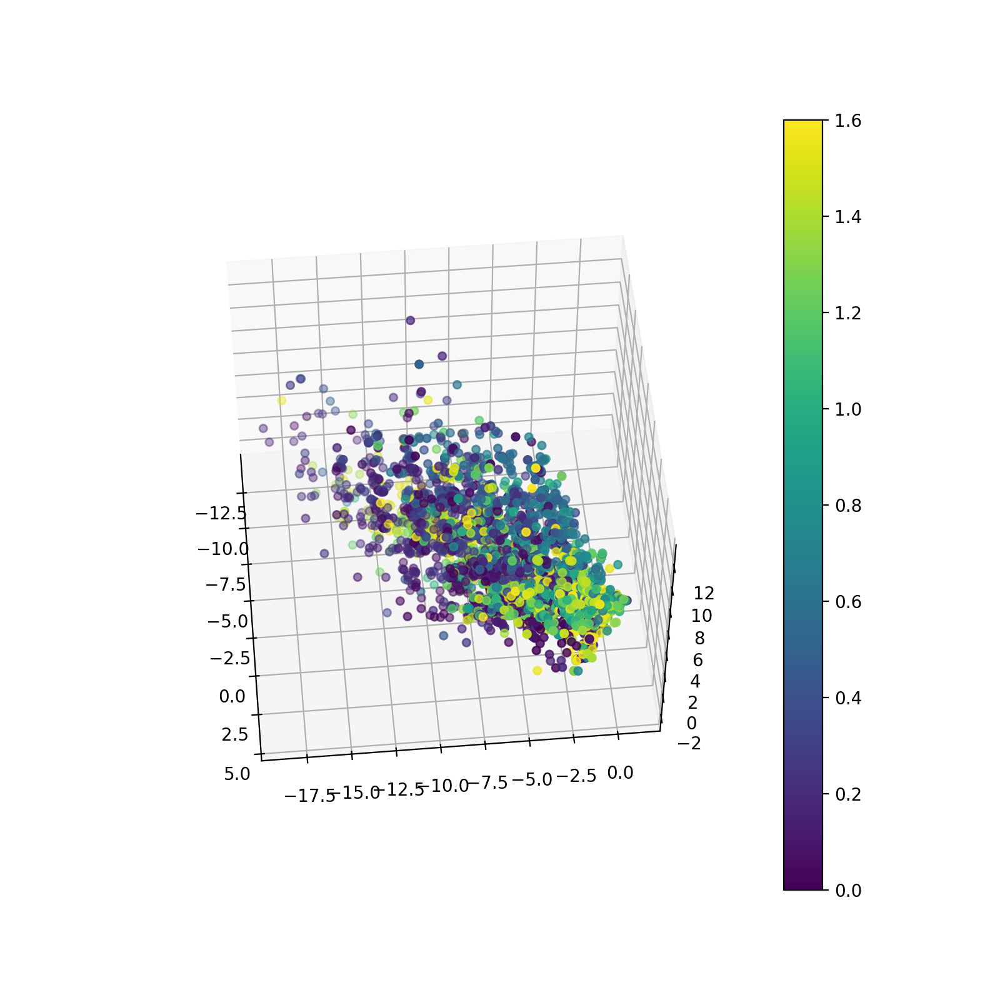

<IPython.core.display.Javascript object>


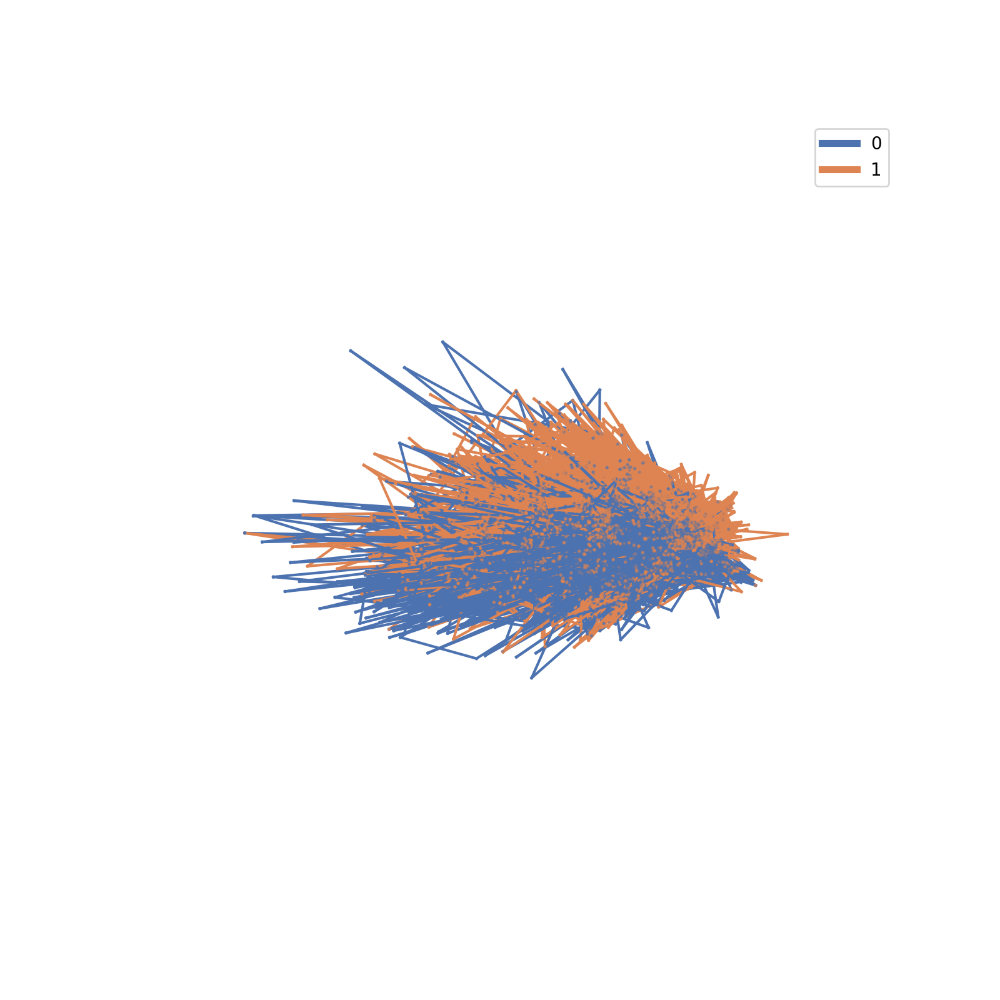

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [16]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_autoenc[:, 0], Y0_autoenc[:, 1], Y0_autoenc[:, 2], c=B_[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_autoenc, B_[:,1].astype(int), state_names = ['0', '1'])

## Autoregressor-autoencoder (ArAe)

In [17]:
from autoencoder import Autoencoder

X_, B_ = prep_data(X, B, win=1)
X0_ = X_[:,0,:,:]
X1_ = X_[:,1,:,:]
Xdiff_ = X1_ - X0_

### Scaling input and output data
Xdmax = (np.abs(Xdiff_)).max() # Parameters for scaling
Xdiff_= Xdiff_/Xdmax

In [18]:
### Deploy ArAe
ArAe = Autoencoder(latent_dim = 3, ninput_shape=X0_.shape)
opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001)
ArAe.compile(optimizer=opt, loss='mse', metrics=['mse'])
history = ArAe.fit(X0_,
                        Xdiff_,
                        epochs=50,
                        batch_size=100,
                        verbose=False,
                        )

### Projecting into latent space
Y0_ArAe = ArAe.encoder(X0_).numpy()

np.savetxt('data/generated/saved_Y/comparison_algorithms/Y0_ArAe_rat_' + str(rat_name), Y0_ArAe)
np.savetxt('data/generated/saved_Y/comparison_algorithms/B_ArAe_rat_' + str(rat_name), B_)

<IPython.core.display.Javascript object>


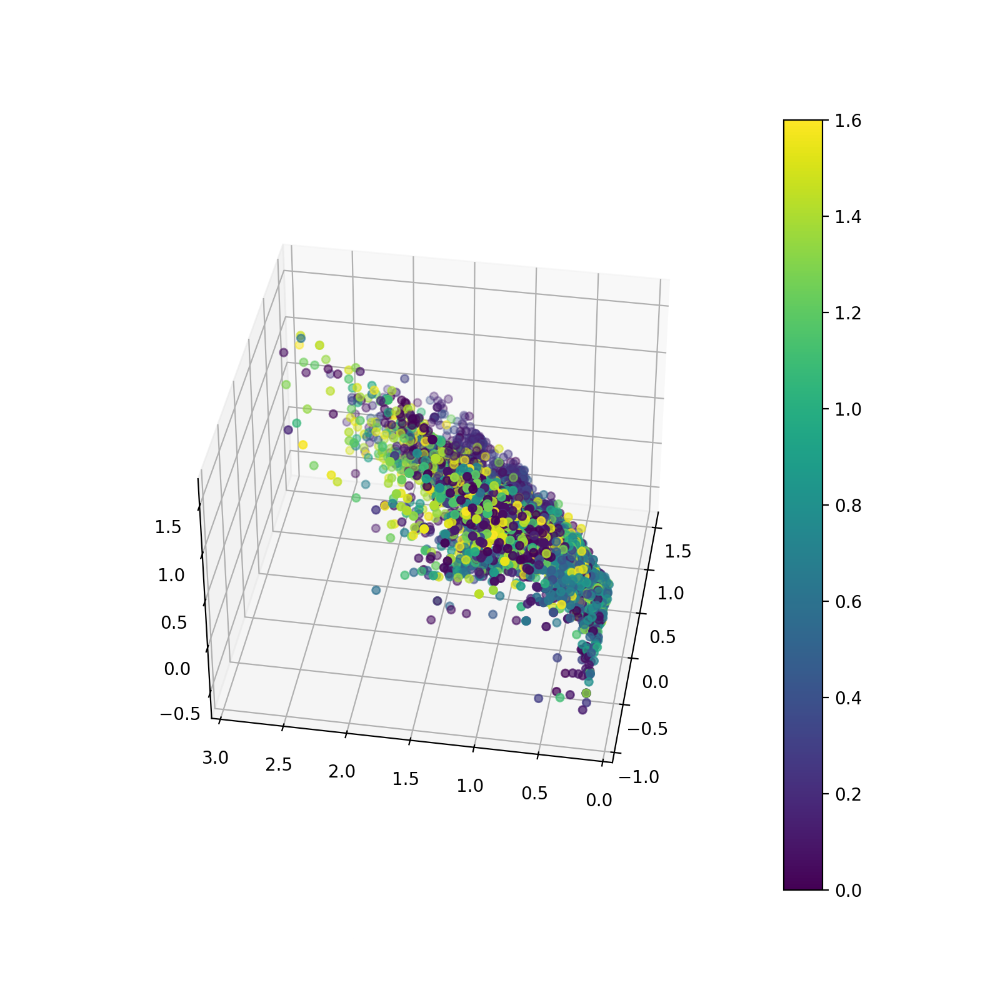

<IPython.core.display.Javascript object>


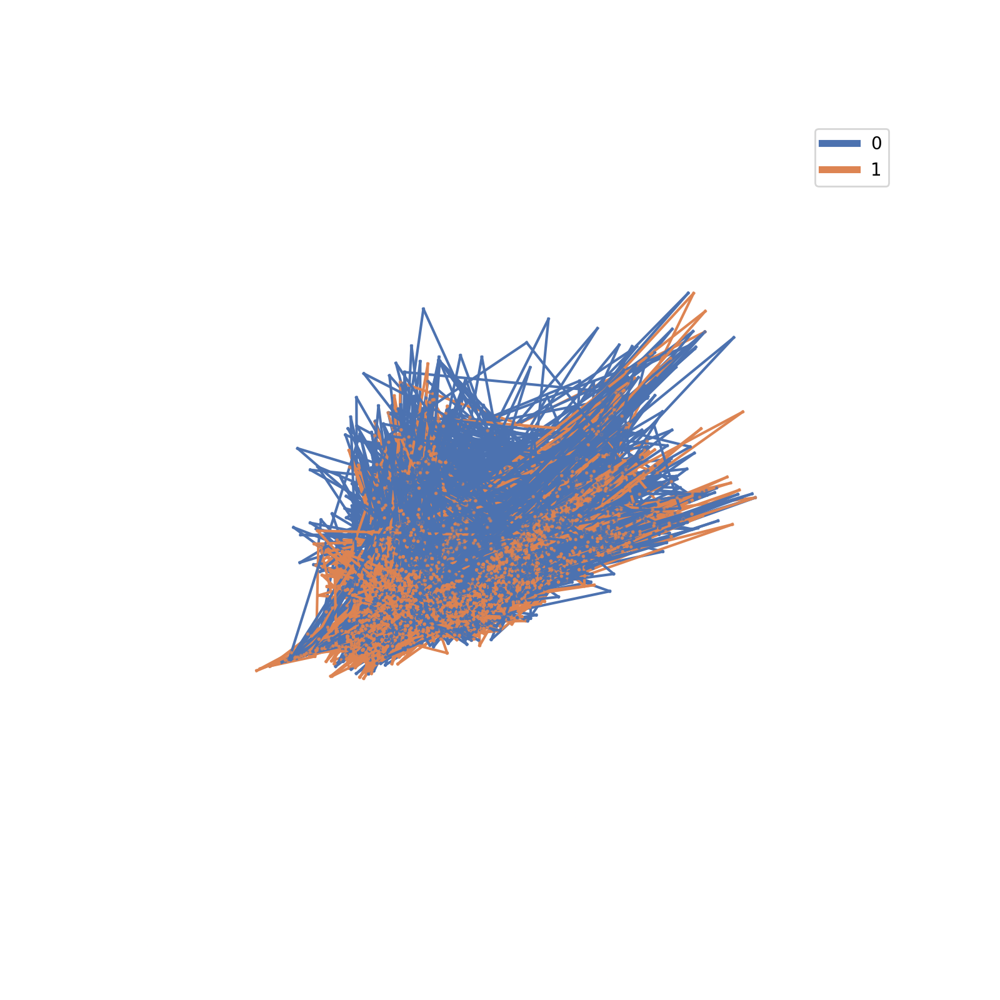

(<Figure size 800x800 with 1 Axes>, <Axes3D: >)

In [19]:
%matplotlib notebook
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
true_y_line = ax.scatter(Y0_ArAe[:, 0], Y0_ArAe[:, 1], Y0_ArAe[:, 2], c=B_[:,0])
plt.colorbar(true_y_line)
plt.show()

plot_phase_space(Y0_ArAe, B_[:,1].astype(int), state_names = ['0', '1'])

## Plotting everything to compare

<IPython.core.display.Javascript object>


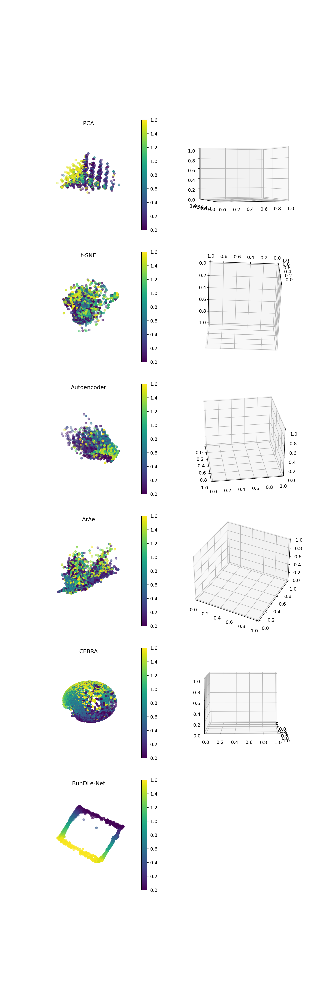

In [23]:
Y0_pca = np.loadtxt('data/generated/saved_Y/comparison_algorithms/Y0_pca_rat_' + str(rat_name))
B_pca = np.loadtxt('data/generated/saved_Y/comparison_algorithms/B_pca_rat_' + str(rat_name))

fig, ax = plt.subplots(6,2,figsize=(10,30),subplot_kw=dict(projection='3d'))

elev = [0,-65,29,37,7,27]
azim = [-109,178,-8,-63,1,-116]
algs = ['pca', 'tsne', 'autoenc', 'ArAe', 'cebra', 'BunDLeNet']
titles = ['PCA', 't-SNE', 'Autoencoder', 'ArAe', 'CEBRA', 'BunDLe-Net']
for i, (alg, title) in enumerate(zip(algs,titles)):
    Y0_= np.loadtxt('data/generated/saved_Y/comparison_algorithms/Y0_' + alg + '_rat_' + str(rat_name))
    B_ = np.loadtxt('data/generated/saved_Y/comparison_algorithms/B_' + alg + '_rat_' + str(rat_name))

    pcm = ax[i, 0].scatter(Y0_[:, 0], Y0_[:, 1], Y0_[:, 2], c=B_[:,0])
    ax[i, 0].set_title(title)
    ax[i, 0].grid(False)
    ax[i, 0].axis('off')
    ax[i, 0].view_init(elev=elev[i], azim=azim[i], roll=0)
    fig.colorbar(pcm, ax=ax[i, 0])
    
    ax[i, 1].view_init(elev=elev[i], azim=azim[i], roll=0)
    #plot_ps_(fig, ax[i,1], Y=Y0_, B=B_[:,1].astype(int), state_names=['0','1'])
    
plt.grid(False)
plt.axis('off')
plt.show()

/tmp/ipykernel_240288/4245702653.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


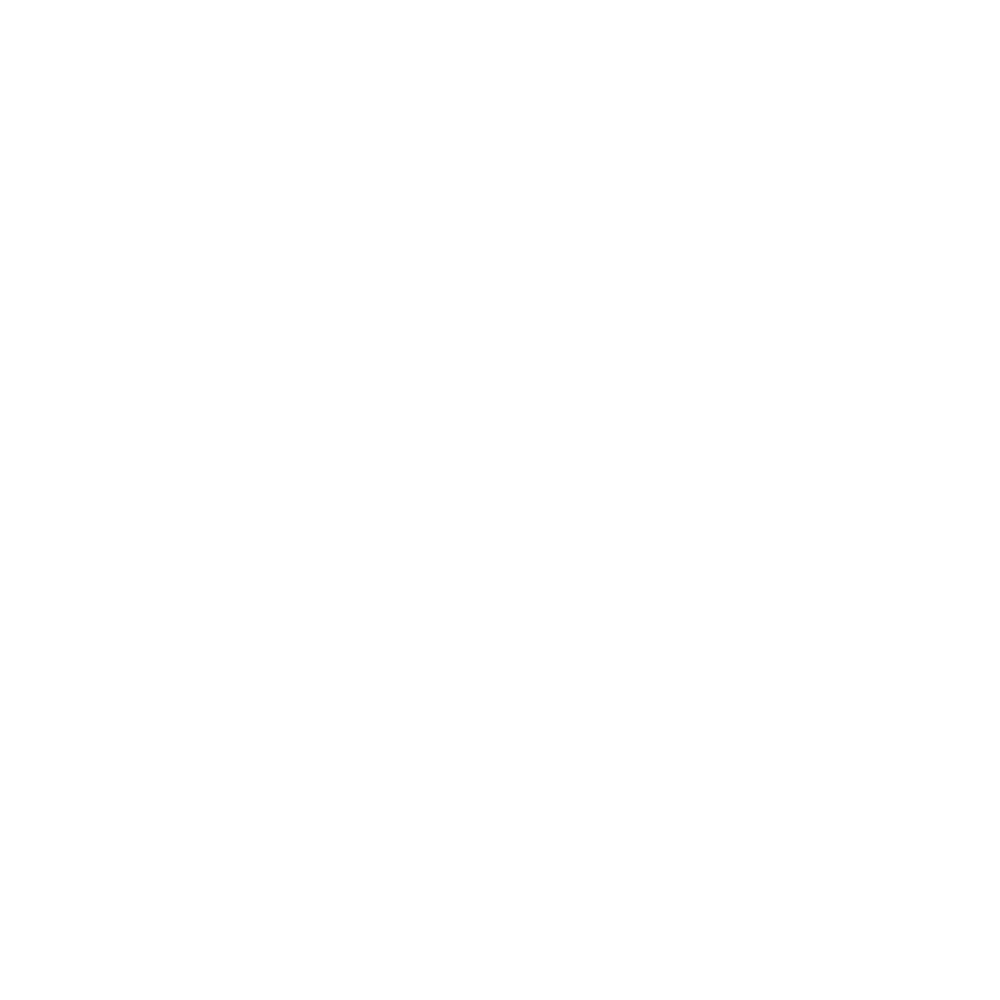

<IPython.core.display.Javascript object>


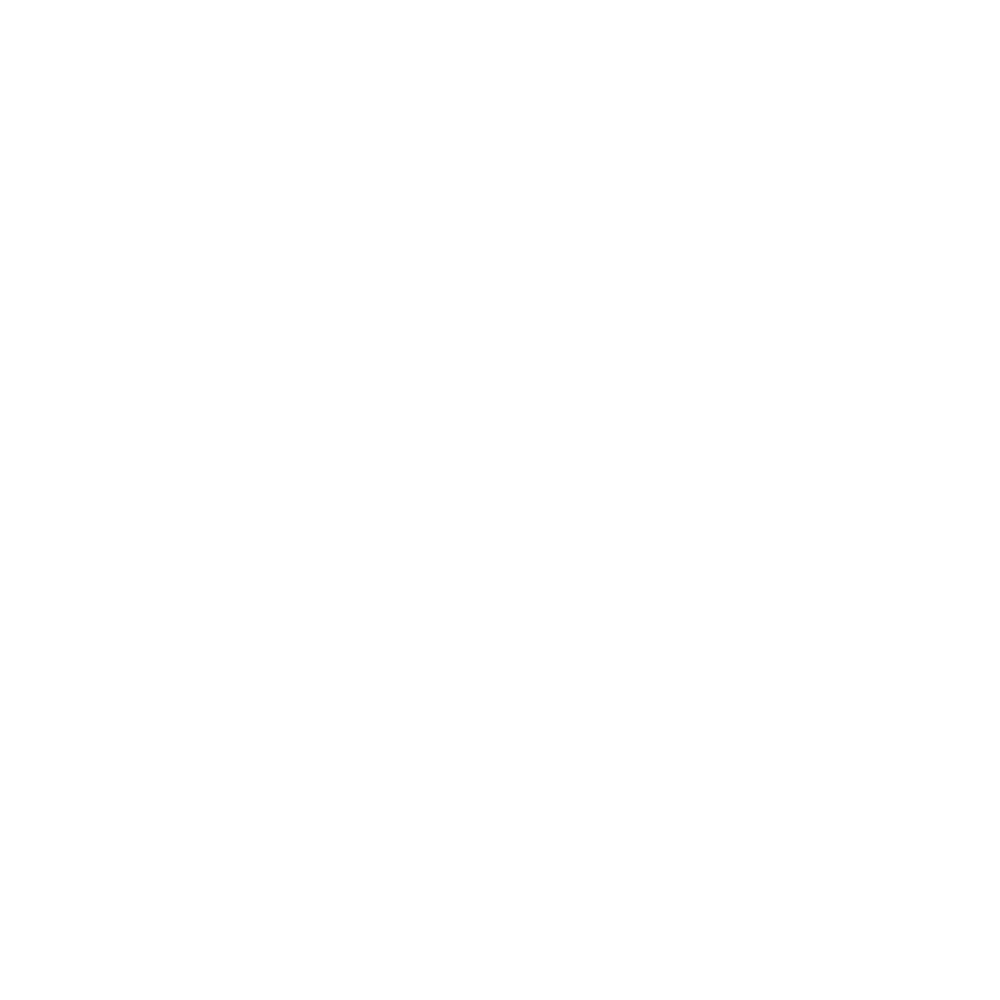

<IPython.core.display.Javascript object>


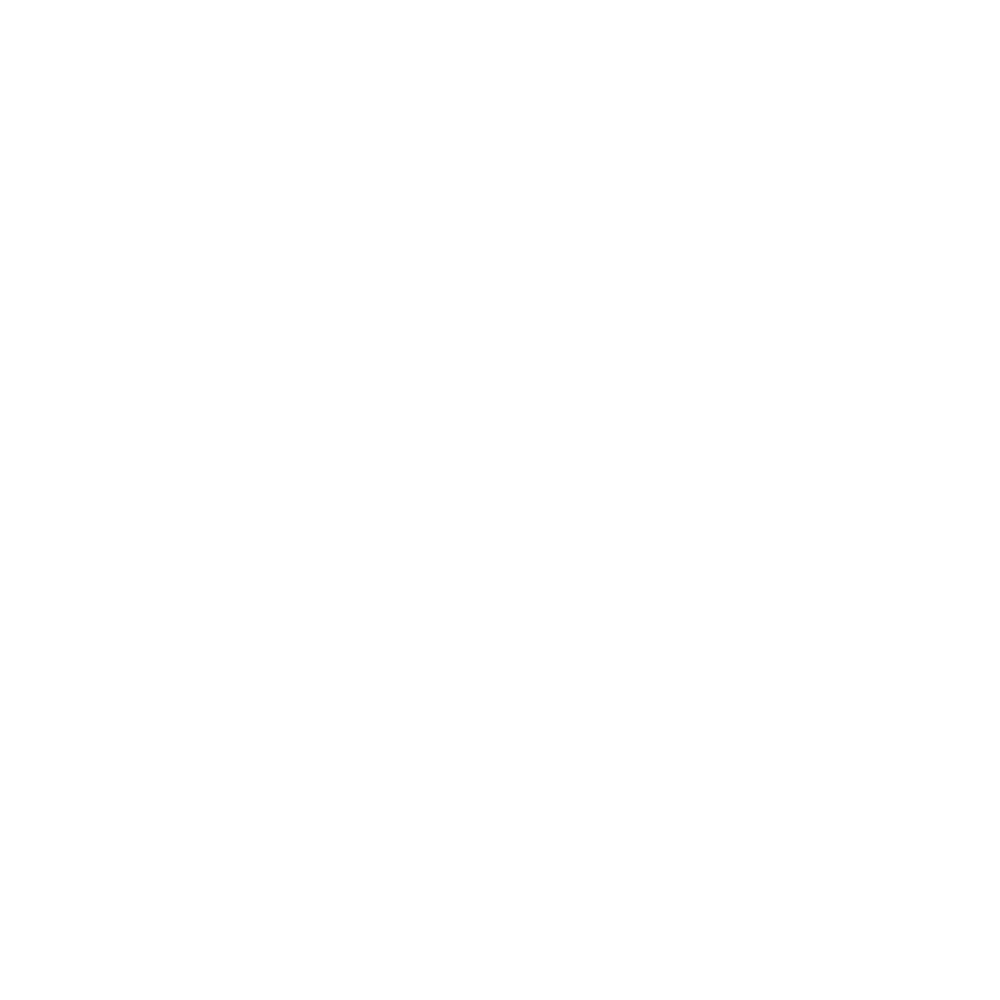

<IPython.core.display.Javascript object>


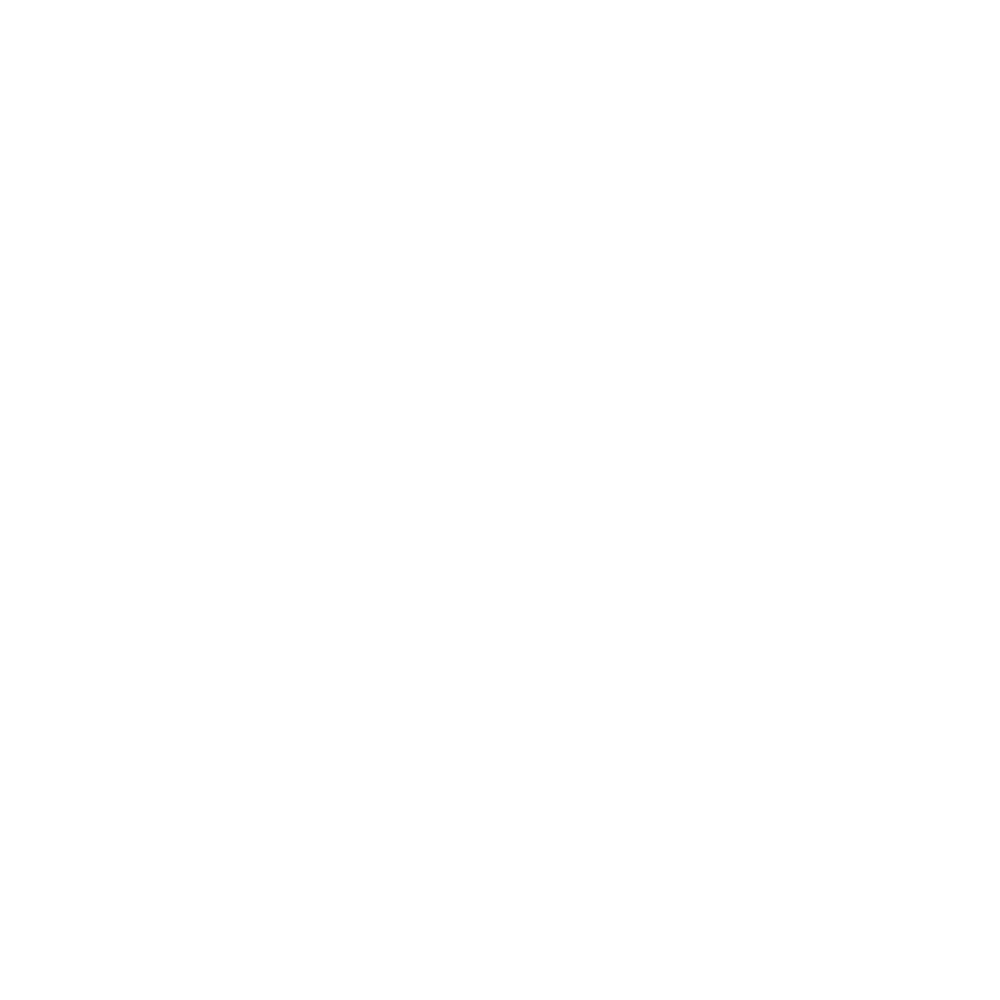

<IPython.core.display.Javascript object>


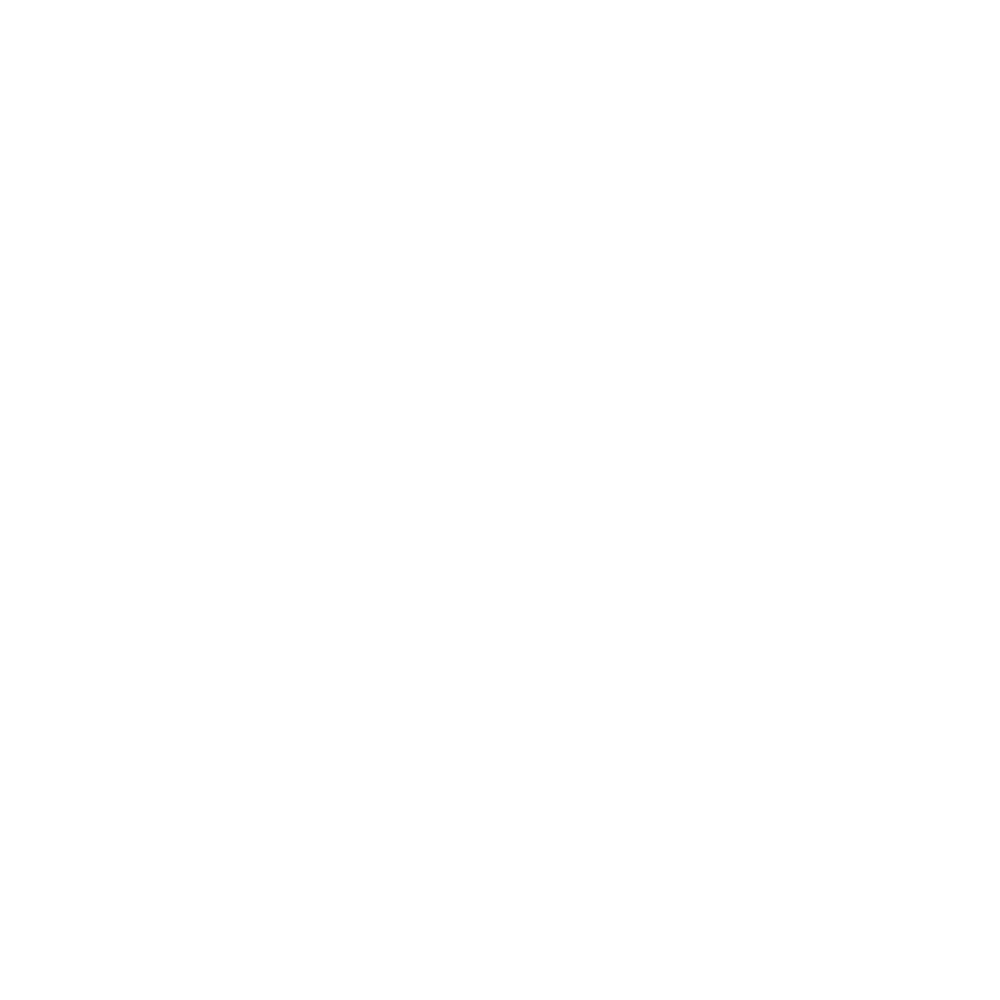

<IPython.core.display.Javascript object>


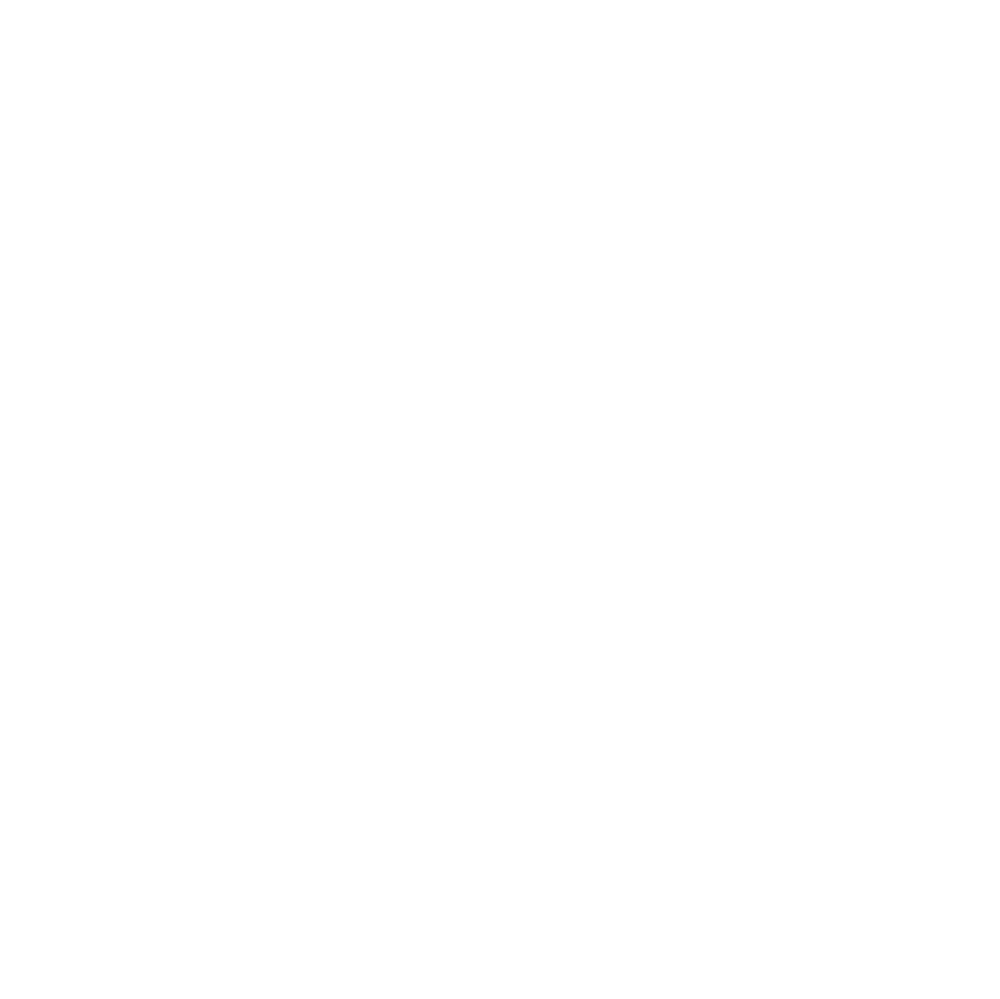

<IPython.core.display.Javascript object>


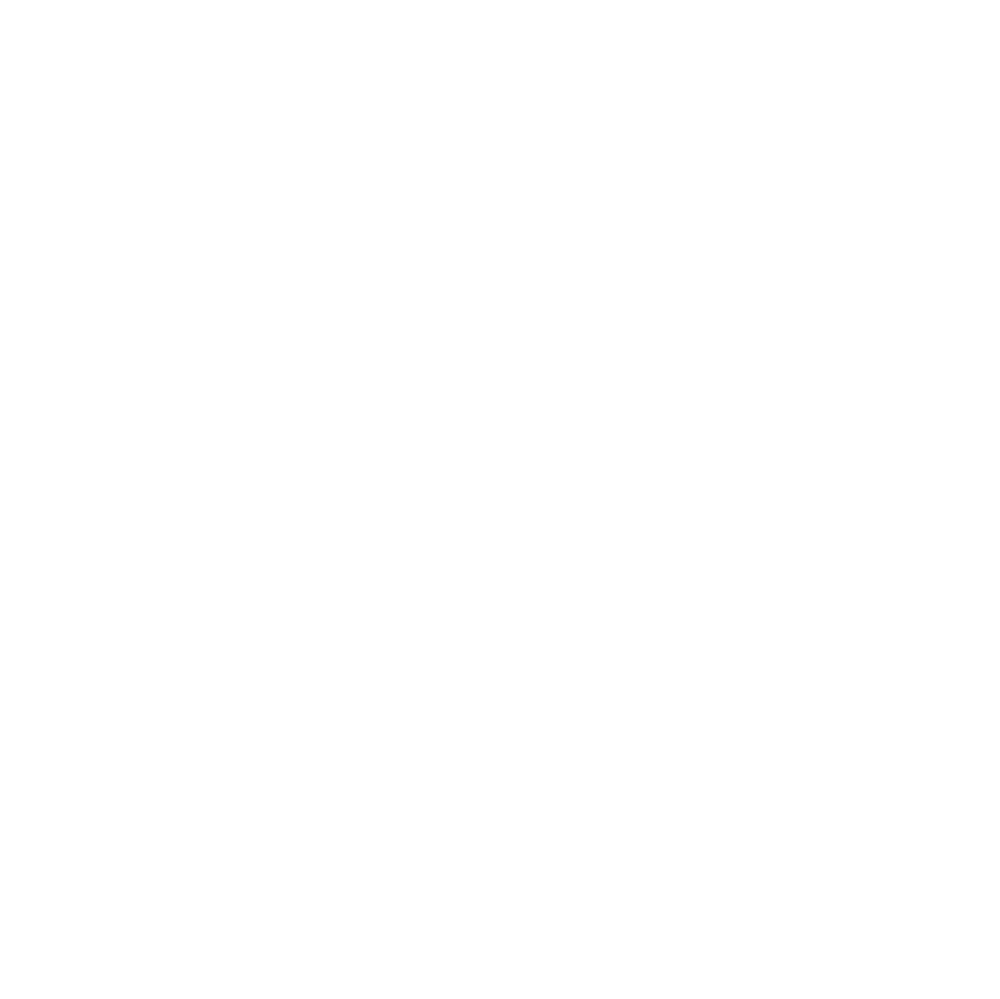

<IPython.core.display.Javascript object>


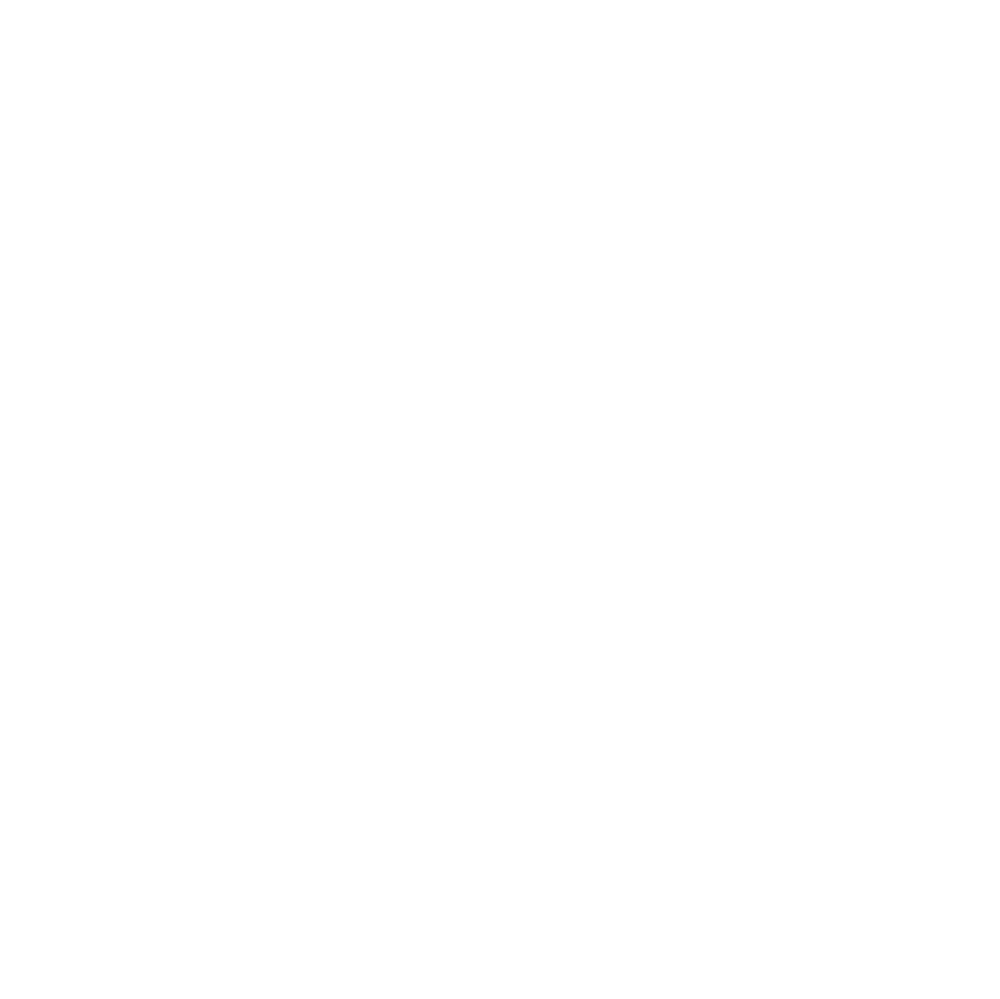

<IPython.core.display.Javascript object>


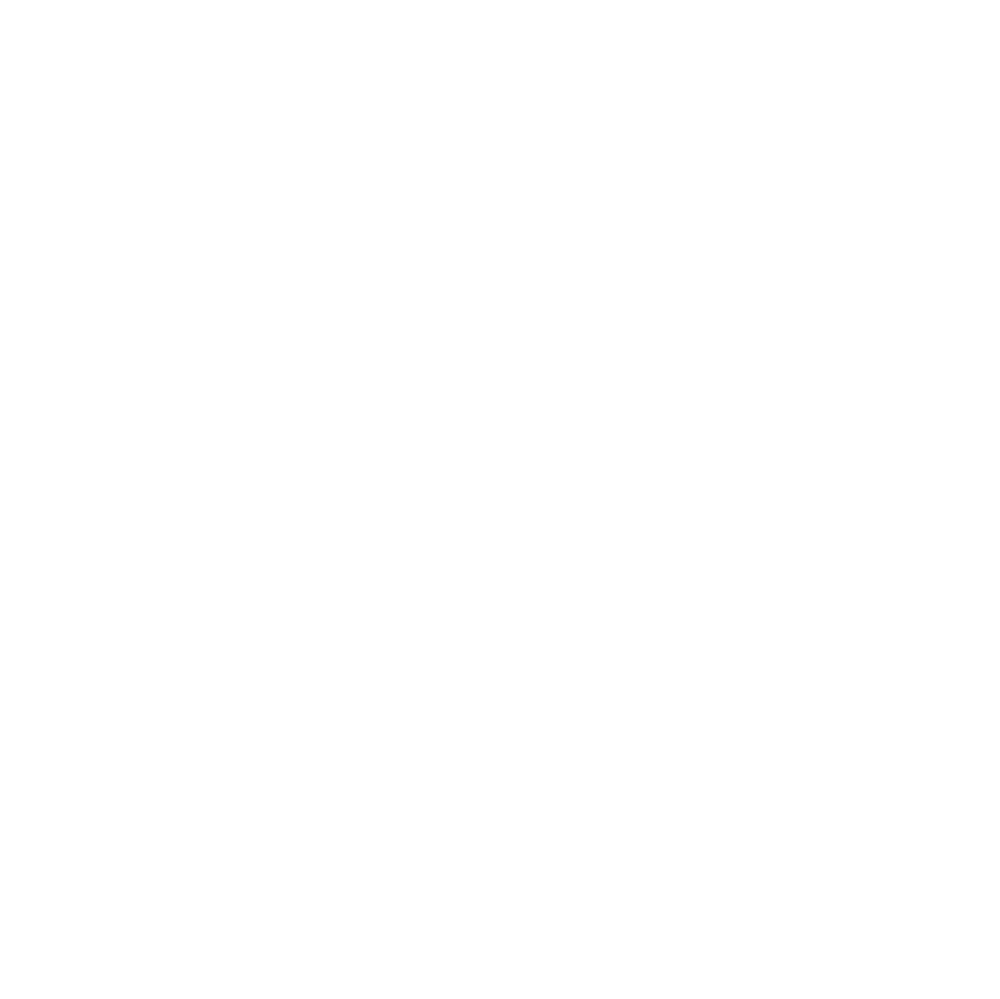

<IPython.core.display.Javascript object>


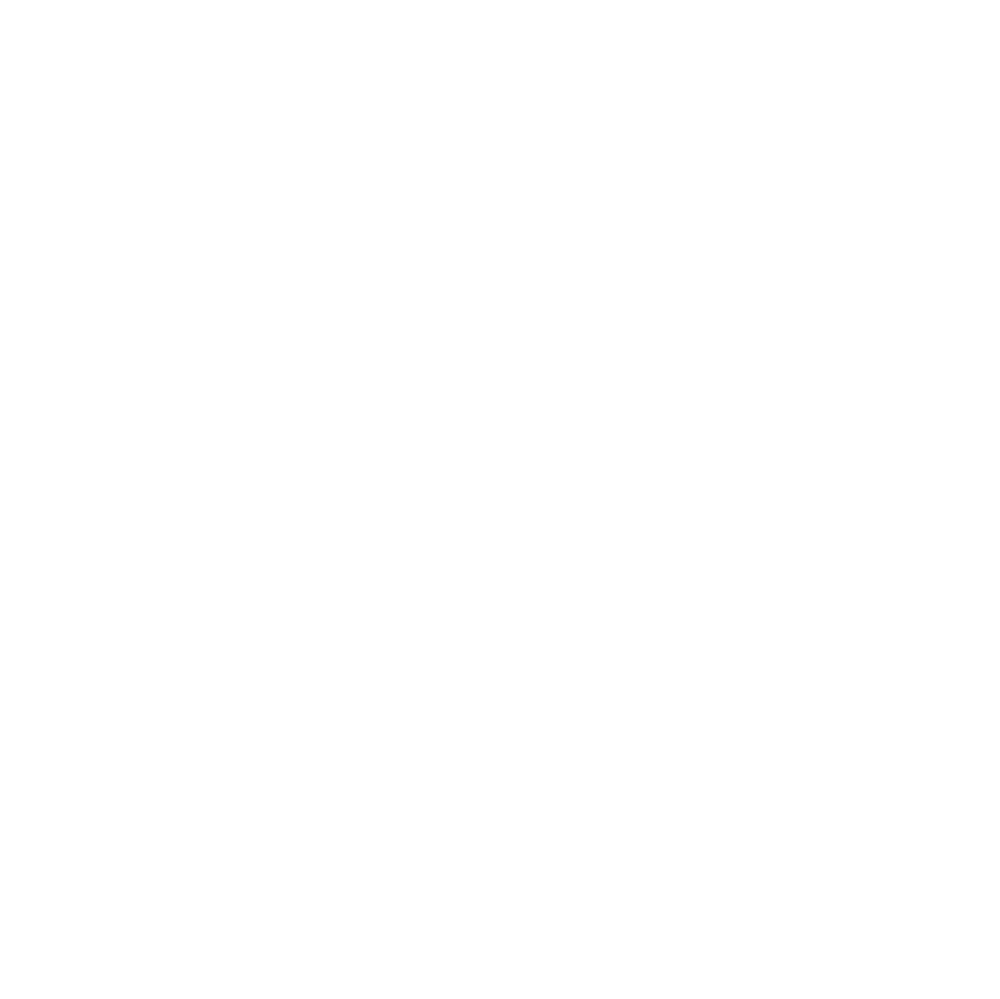

<IPython.core.display.Javascript object>


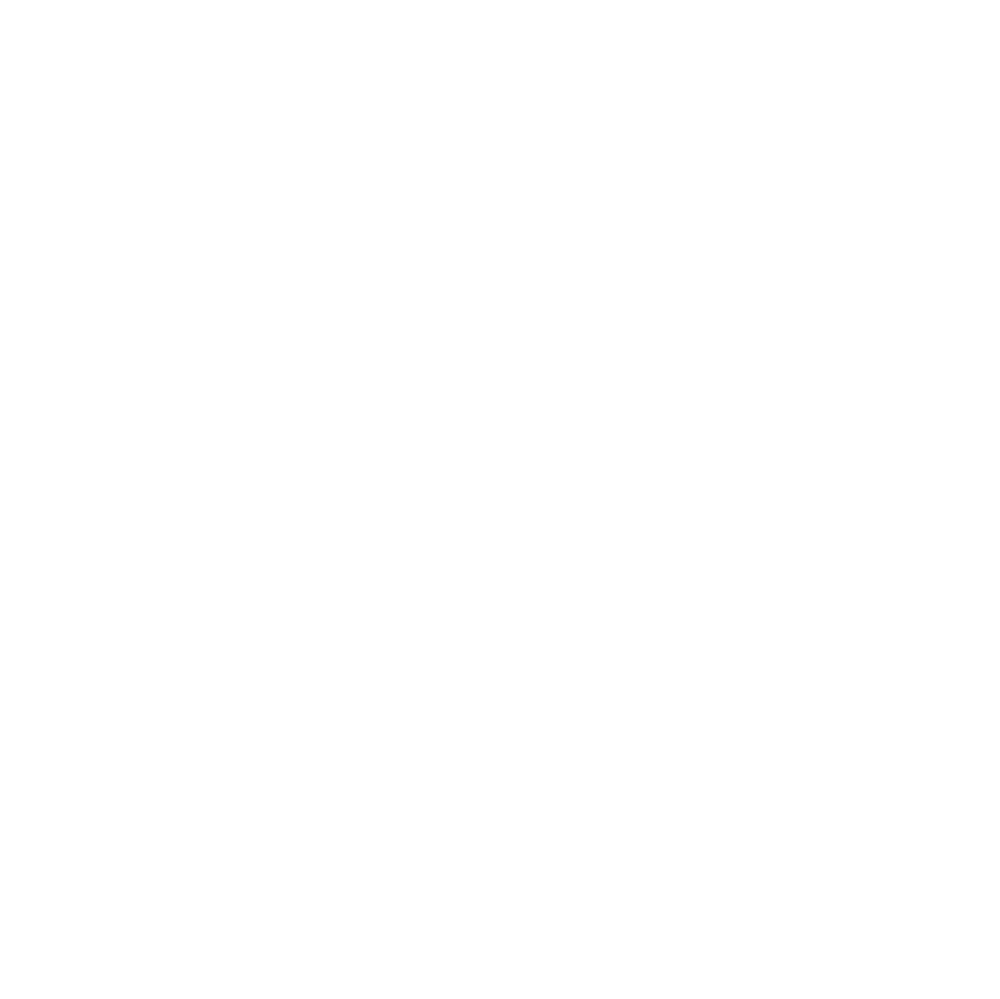

<IPython.core.display.Javascript object>


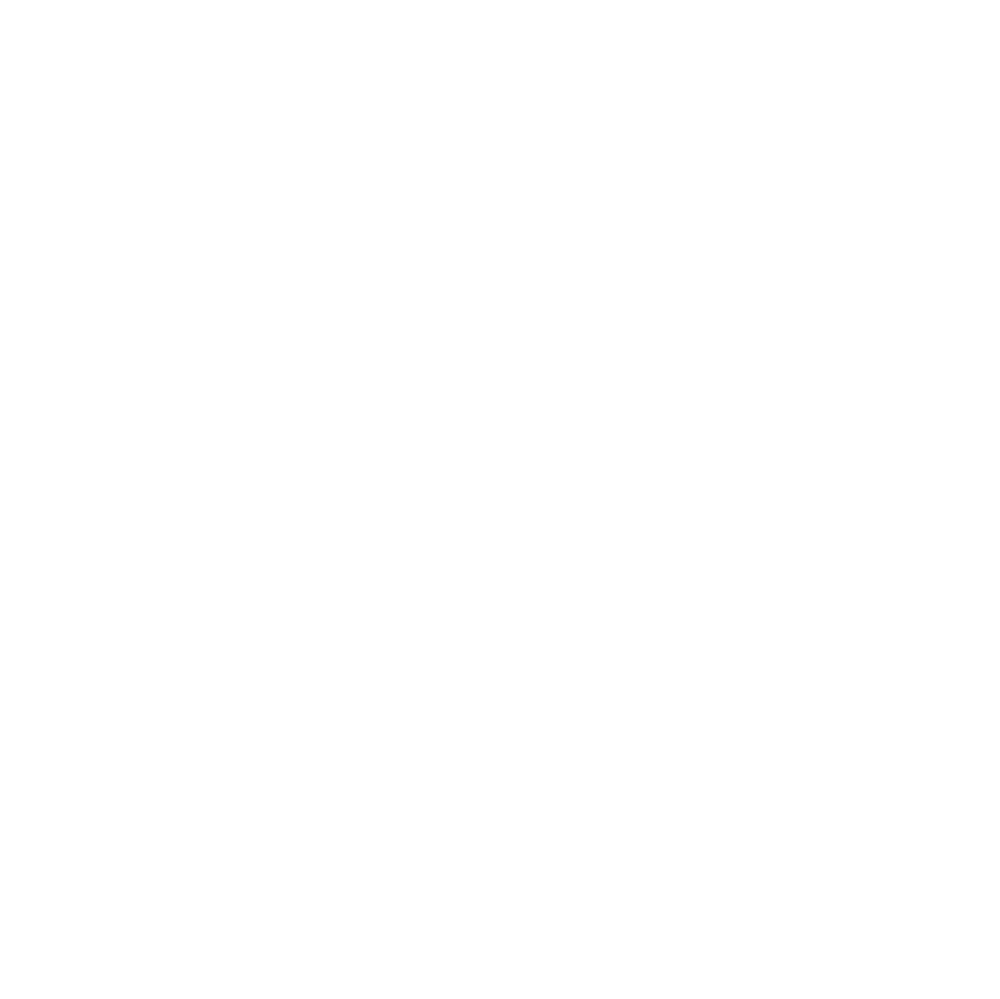

<IPython.core.display.Javascript object>


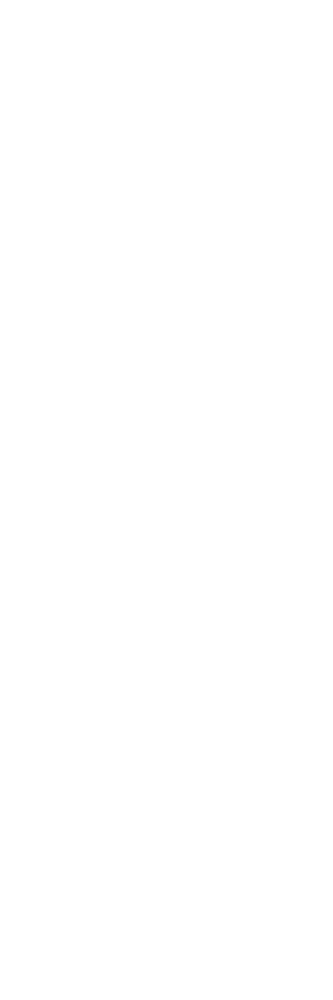

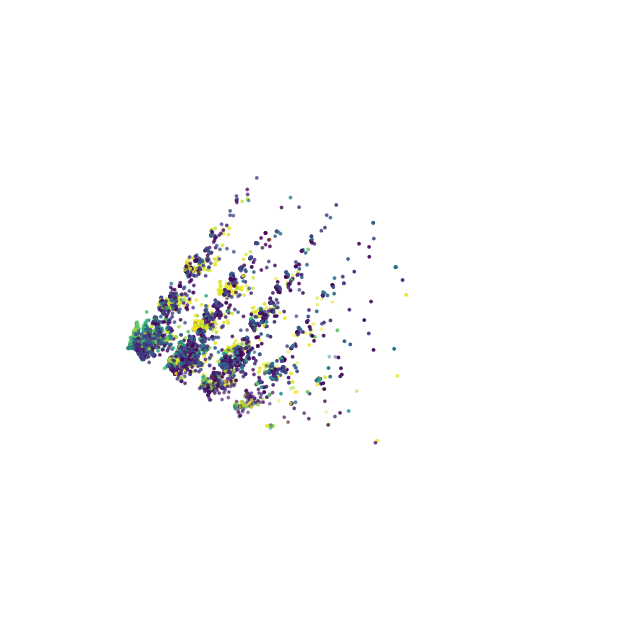

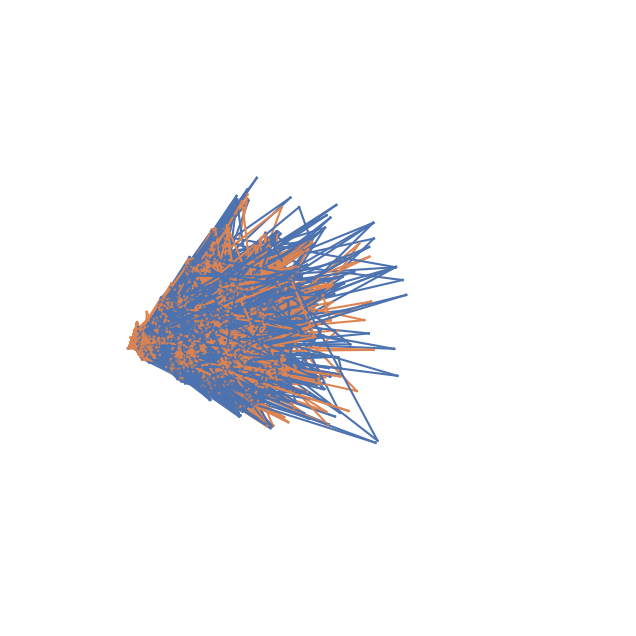

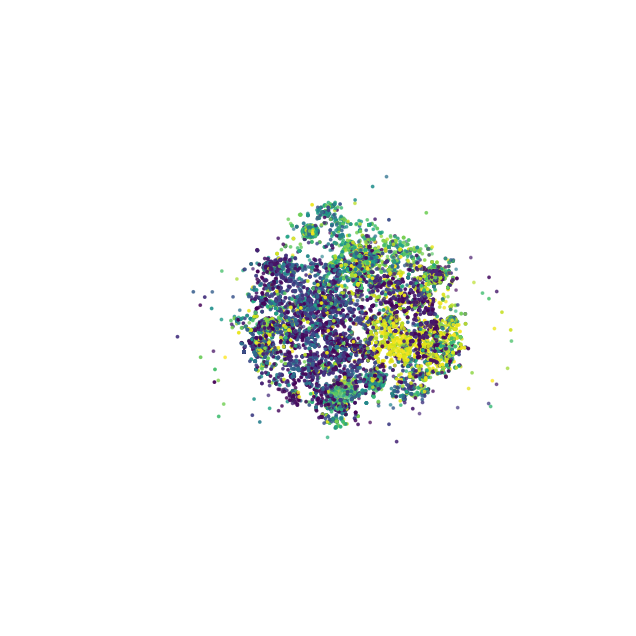

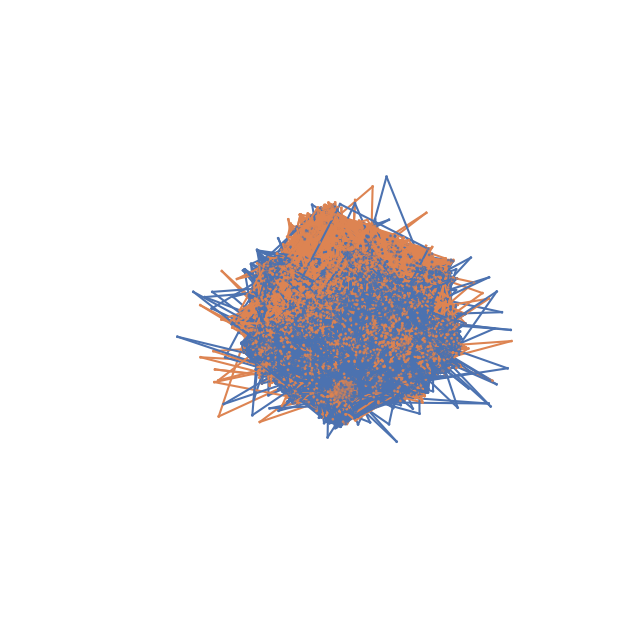

...

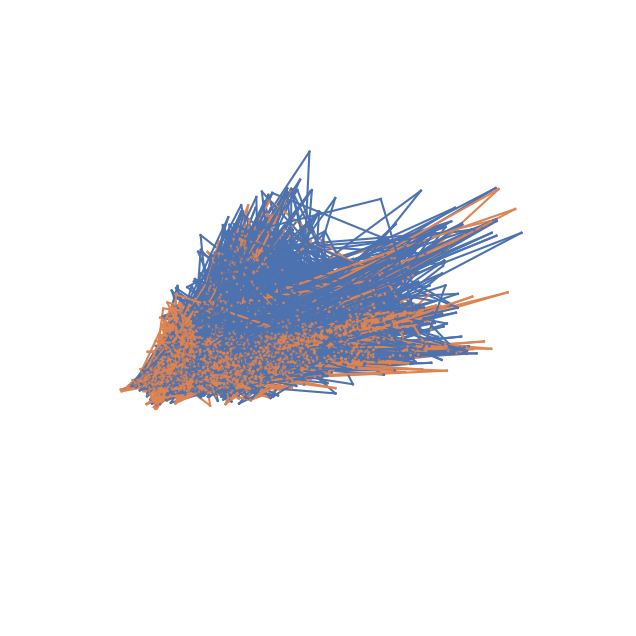

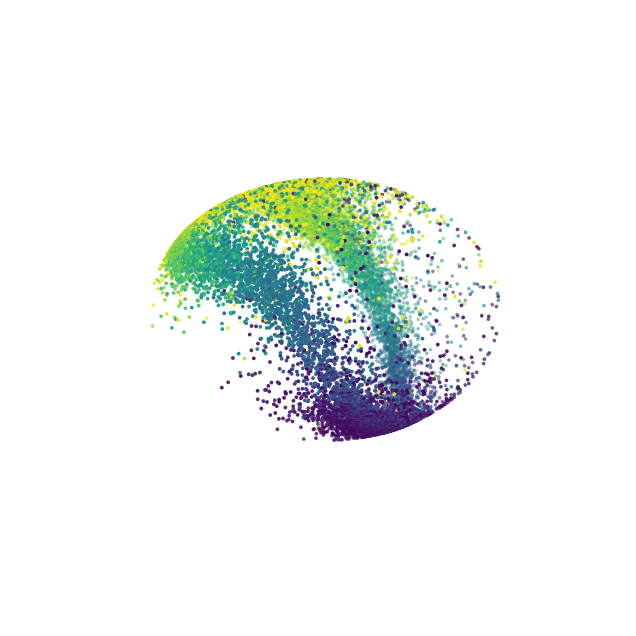

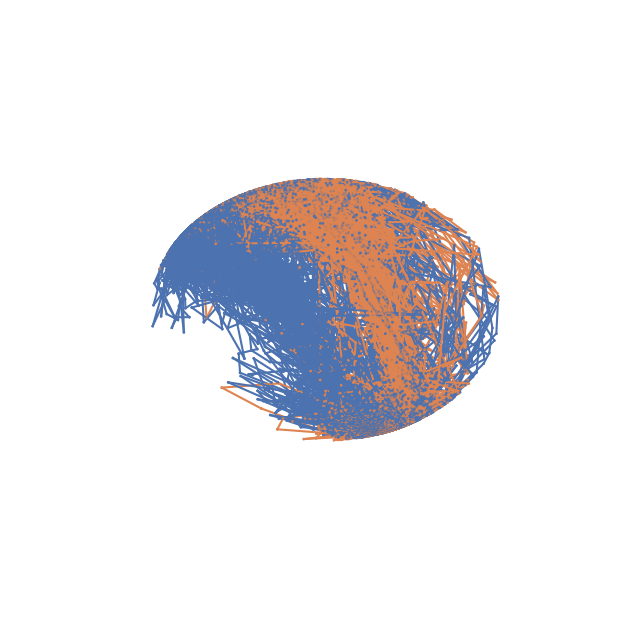

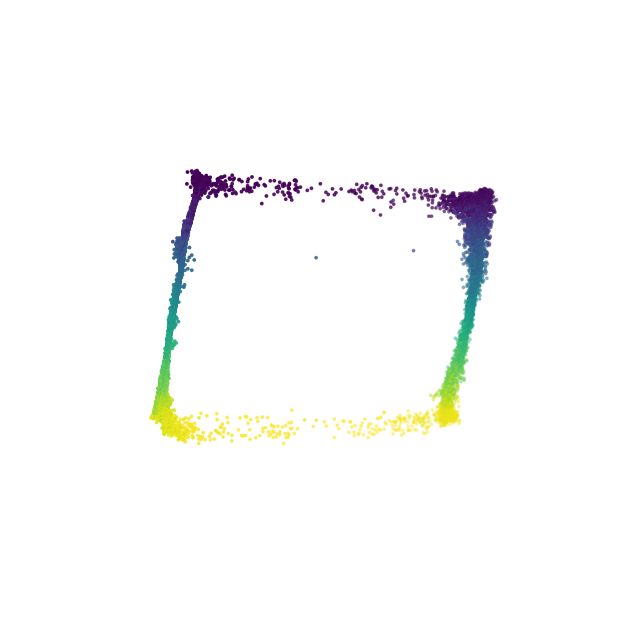

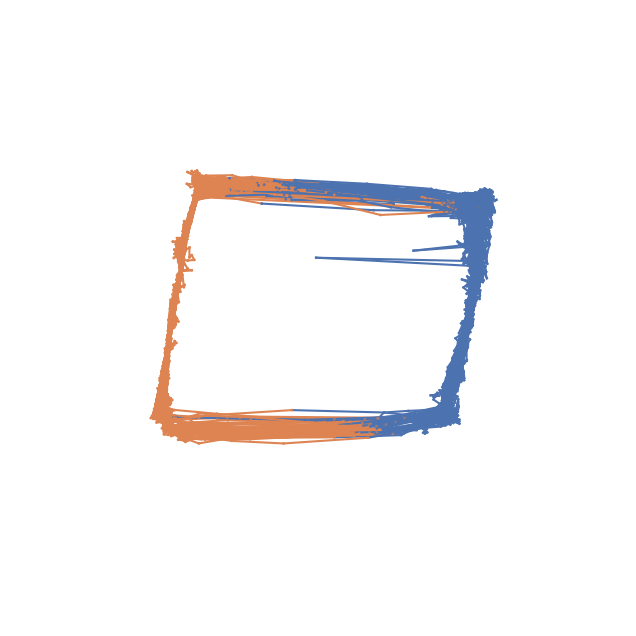

In [24]:
%matplotlib inline
# Code to save figures for paper
elev = [0,-65,29,37,7,27]
azim = [-109,178,-8,-63,1,-116]
algs = ['pca', 'tsne', 'autoenc', 'ArAe', 'cebra', 'BunDLeNet']
titles = ['PCA', 't-SNE', 'Autoencoder', 'ArAe', 'CEBRA', 'BunDLe-Net']
for i, (alg, title) in enumerate(zip(algs,titles)):
    #1
    fig = plt.figure(figsize=(8, 8))
    ax = plt.axes(projection='3d')
    
    Y0_= np.loadtxt('data/generated/saved_Y/comparison_algorithms/Y0_' + alg + '_rat_' + str(rat_name))
    B_ = np.loadtxt('data/generated/saved_Y/comparison_algorithms/B_' + alg + '_rat_' + str(rat_name))

    pcm = ax.scatter(Y0_[:, 0], Y0_[:, 1], Y0_[:, 2], c=B_[:,0], s=3)
    ax.grid(False)
    ax.axis('off')
    ax.view_init(elev=elev[i], azim=azim[i], roll=0)
    plt.savefig('figures/rat_' + rat_name + '/embedding_' + algs[i] + '_position_labels', transparent=True, bbox_inches="tight", dpi=300)
    
    #2
    fig = plt.figure(figsize=(8, 8))
    ax = plt.axes(projection='3d')
    ax.view_init(elev=elev[i], azim=azim[i], roll=0)
    plot_ps_(fig, ax, Y=Y0_, B=B_[:,1].astype(int), state_names=['0','1'], legend=False)
    plt.savefig('figures/rat_' + rat_name + '/embedding_' + algs[i] + '_direction_labels', transparent=True, bbox_inches="tight", dpi=300)
